# Data exploration and preparation

In [1]:
# Data management and computation
import numpy as np
import pandas as pd
import os

out_path='Databases'
# Read databases, considering that the first column is just an index
X_train = pd.read_csv(os.path.join(out_path,'X_train.csv'), index_col=0, encoding='utf8')
X_test = pd.read_csv(os.path.join(out_path,'X_test.csv'), index_col=0, encoding='utf8')
y_train = pd.read_csv(os.path.join(out_path,'y_train.csv'), index_col=0, encoding='utf8')
y_test = pd.read_csv(os.path.join(out_path,'y_test.csv'), index_col=0, encoding='utf8')


In [2]:
Gringotts = pd.read_csv(os.path.join(out_path,'Gringotts.csv'), index_col=0, encoding='utf8')

In [3]:
# Transform identified categories

def ColToCategory(df:pd.DataFrame, col:str, categories:list, ordered=True):
    """Transform the column col of the dataframe df to ordered (or not) category
    using the categories list"""
    df[col] = pd.Categorical(df[col], ordered=ordered,categories=categories)
    return None

ColToCategory(X_train,'Cut', ['Ideal', 'Premium', 'Very Good', 'Good', 'Fair'][::-1])
ColToCategory(X_test,'Cut', ['Ideal', 'Premium', 'Very Good', 'Good', 'Fair'][::-1])
ColToCategory(X_train,'Color', ['D','E','F','G','H','I','J'][::-1])
ColToCategory(X_test,'Color', ['D','E','F','G','H','I','J'][::-1])
ColToCategory(X_train,'Clarity', ['FL','IF','VVS1','VVS2','VS1','VS2','SI1','SI2','I1','I2'][::-1])
ColToCategory(X_test,'Clarity', ['FL','IF','VVS1','VVS2','VS1','VS2','SI1','SI2','I1','I2'][::-1])


We now describe the other columns in order to see if something is wrong

In [4]:
X_train.describe()

,Carat,Depth,Table,x,y,z,longitude
count,43144.000000,40791.000000,43144.000000,42275.000000,42686.00000,43144.000000,43144.000000
mean,0.798877,61.749334,57.455732,5.732277,5.73517,3.539997,-86.832835
std,0.474614,1.432068,2.237442,1.130010,1.14982,0.709886,39.560103
min,0.200000,43.000000,43.000000,-6.370000,-6.61000,-2.940000,-170.478889
25%,0.400000,61.000000,56.000000,4.720000,4.72000,2.910000,-112.138611
50%,0.700000,61.800000,57.000000,5.690000,5.71000,3.530000,-87.906389
75%,1.050000,62.500000,59.000000,6.550000,6.54000,4.040000,-78.680278
max,5.010000,79.000000,95.000000,10.740000,58.90000,31.800000,178.017649


There are some values in x,y,z that are negative, which seems strange

In [5]:
import plotly.express as px

px.histogram(data_frame=X_train, x='Carat', color='Cut', 
             category_orders={"Cut": ['Ideal', 'Premium', 'Very Good', 'Good', 'Fair']})

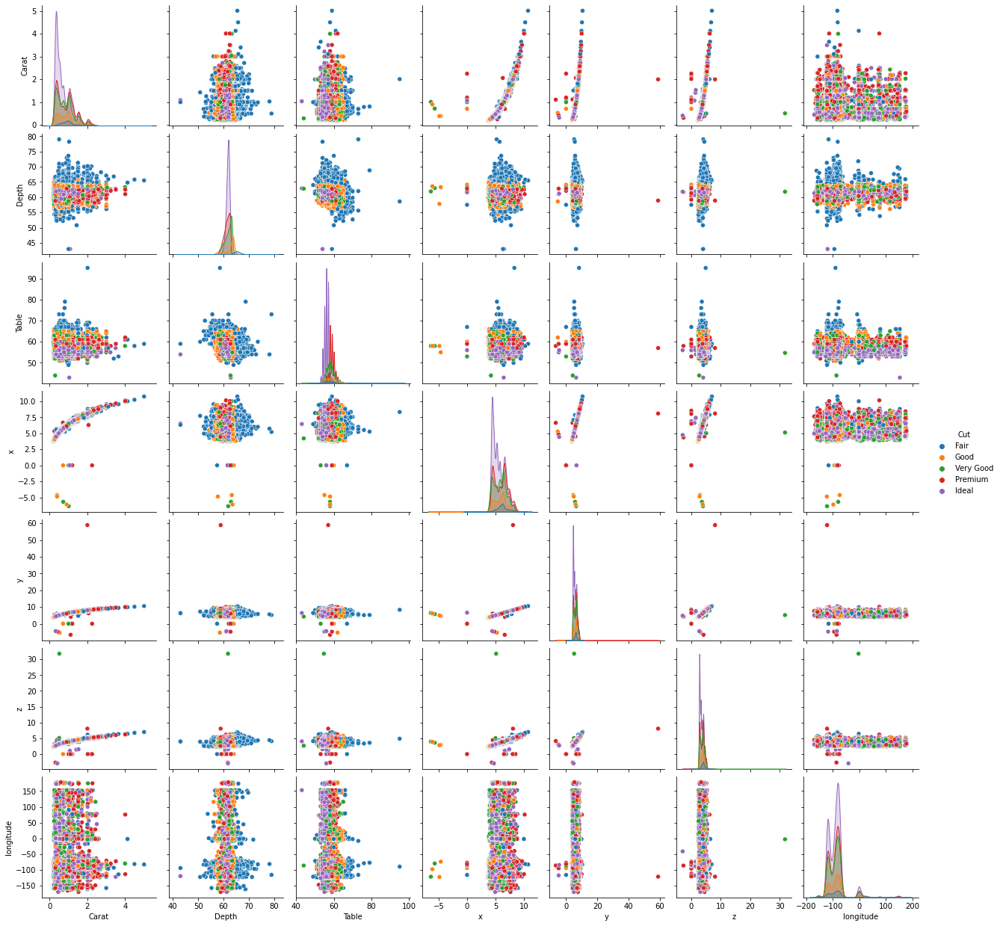

In [6]:
import seaborn as sns
sns.pairplot(data=X_train, hue='Cut')

It is interesting to see that the carat seems to have a high relationship with x,y and z, which also suggest that the x,y and z values under 0 are wrong.

If they are sizes, then their product can be some approximation to volume

In [7]:
px.scatter(x=np.log(X_train['Carat']), y=np.log(y_train['Price']), color=X_train['Color'], symbol=X_train['Cut'],
           category_orders={"Color": ['D','E','F','G','H','I','J']})

In [8]:
px.scatter(x=X_train['x']*X_train['y']*X_train['z'], y=X_train['Carat'], 
           color=X_train['Cut'])

It seems that the color is relevant in producing price changes, visually cut is not that important. From the second plot we are suggested that (because of some kind of slope symmetry around the vertical axis) we can clean some data by taking absolute value...

The consideration of the other points would be complicated, and require more thought time than I can give to it. Therefore the strategy will be delete the values with 0 "volume" and try to see if there's some error in the order of magnitude of the enormous volumes

In [9]:
# Take positive values only
X_train[['x','y','z']] = np.abs(X_train[['x','y','z']])

# Eliminate "0 volume" from training set
index0 = X_train[(X_train['x']<1e-3) | (X_train['y']<1e-3) | (X_train['z']<1e-3)].index
X_train.drop(index0, inplace=True)
y_train.drop(index0, inplace=True)

# Plot
px.scatter(x=X_train['x']*X_train['y']*X_train['z'], y=X_train['Carat'], 
           color=X_train['Cut'])

In [10]:
# Explore elements with enormous volume
index_big = X_train[X_train['x']*X_train['y']*X_train['z']>800].index
X_train.loc[index_big]

,Carat,Cut,Color,Clarity,Depth,Table,x,y,z,latitude,longitude
48401,0.51,Very Good,E,VS1,61.8,54.7,5.12,5.15,31.80,51.015344,-3.106849
24063,2.00,Premium,H,SI2,58.9,57.0,8.09,58.90,8.06,39.7286111,-121.836389


In [11]:
# Clean data
X_train['y'] = np.where(X_train['y'] < 50, X_train['y'], X_train['y']/10)
X_train['z'] = np.where(X_train['z'] < 30, X_train['z'], X_train['z']/10)

In [12]:
# Plot
px.scatter(x=X_train['x']*X_train['y']*X_train['z'], y=X_train['Carat'], 
           color=X_train['Cut'])

Data now seems cleaner. Now take a look at another "size proxy" Table*Depth

In [13]:
px.scatter(y=y_train['Price'],x=X_train['Table']*X_train['Depth'])

Didn't work...

In [14]:
px.scatter(x=X_train['x']*X_train['y']*X_train['z'], y=y_train['Price'], 
           color=X_train['Cut'])

Now try to take a look at the geographical data

In [15]:
X_train['latitude'].astype('float')
X_train['longitude'].astype('float')

ValueError: could not convert string to float: '33q.200088'

It seems that we have some characters lost in the geographic data... We will have to clean it

In [16]:
# Search where I can't convert to numeric
print('Errors in latitude')
for item in X_train['latitude']:
    try:
        float(item)
    except:
        print(item)

print('Errors in longitude')
for item in X_train['longitude']:
    try:
        float(item)
    except:
        print(item)

Errors in latitude
33q.200088
Errors in longitude


In [17]:
# Modify values
X_train.loc[X_train['latitude']=='33q.200088', 'latitude'] = 33.200088

In [18]:
X_train[['latitude','longitude']] = X_train[['latitude','longitude']].astype('float')

In [19]:
# See locations
fig = px.scatter_mapbox(data_frame=X_train, lat="latitude", lon="longitude", 
                        #color='Color', 
                        zoom=5, height=500)
                        #color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        }
      ],
    title='Locations'
)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

The locations are unclear. I don't know what the points over the sea might mean

In [20]:
# See locations
fig = px.scatter_mapbox(data_frame=Gringotts, lat="latitude", lon="longitude", 
                        #color='Color', 
                        zoom=5, height=500)
                        #color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        }
      ],
    title='Locations'
)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

All of the stolen diamonds are in America. Maybe we chould restrict our attention to diamonds in the USA...

I think the easiest way to do that is to consider a rectangle around the USA

In [21]:
latmin,latmax = 25,50
longmin,longmax = -126,-66

In [22]:
USA_index = X_train.query('25<latitude<50 and -126<longitude<-66').index

X_train_USA = X_train.loc[USA_index]

In [23]:
# See locations
fig = px.scatter_mapbox(data_frame=X_train_USA, lat="latitude", lon="longitude", 
                        #color='Color', 
                        zoom=5, height=500)
                        #color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig.update_layout(
    mapbox_style="white-bg",
    mapbox_layers=[
        {
            "below": 'traces',
            "sourcetype": "raster",
            "sourceattribution": "United States Geological Survey",
            "source": [
                "https://basemap.nationalmap.gov/arcgis/rest/services/USGSImageryOnly/MapServer/tile/{z}/{y}/{x}"
            ]
        }
      ],
    title='Locations'
)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [25]:
y_train_USA = y_train.loc[USA_index]

We can now see if the variance has been reduced

In [26]:
px.scatter(x=np.log(X_train_USA['Carat']), y=np.log(y_train_USA['Price']), color=X_train_USA['Color'], symbol=X_train_USA['Cut'],
           category_orders={"Color": ['D','E','F','G','H','I','J']})

In [27]:
X_train_USA.isna().sum()

Carat           0
Cut             0
Color           0
Clarity         0
Depth        2119
Table           0
x             780
y             415
z               0
latitude        0
longitude       0
dtype: int64

In [28]:
X_train_USA.shape

(38986, 11)

In [29]:
X_train.shape

(43129, 11)

We can now save both databases

In [30]:
out_path = 'Databases'

X_train.to_csv(os.path.join(out_path,'X_train_clean.csv'))
y_train.to_csv(os.path.join(out_path,'y_train_clean.csv'))
X_train_USA.to_csv(os.path.join(out_path,'X_train_USA.csv'))
y_train_USA.to_csv(os.path.join(out_path,'y_train_USA.csv'))
